<h1 align="center"> Enhancing Electricity Price Forecasting with a Detection-Informed Hybrid Model </h1>

## Project Overview

This project addresses the complex challenge of electricity price forecasting, especially in the context of increasing renewable energy integration. Traditional methods often struggle with the variability and unpredictability of electricity prices due to the dynamic nature of renewable energy sources like wind and solar power. This project aims to develop a more accurate and adaptable forecasting model by combining Gated Recurrent Units (GRU) and eXtreme Gradient Boosting (XGBoost) with a focus on detecting and adapting to concept drift.

## Data Set Explanation

The project utilizes a multivariate time series forecasting approach, integrating two distinct datasets:

- **Electricity Price and Consumption Data:** Sourced from the Spanish electricity market, this dataset includes hourly records of electricity consumption, pricing, and generation. The data covers a period from 2015 to 2019, providing a comprehensive view of the electricity market dynamics in Spain. Data sources include the [ENTSOE transparency platform](https://transparency.entsoe.eu/dashboard/show) and the [Spanish TSO Red Electric España](https://www.esios.ree.es/en/market-and-prices?date=27-03-2023#).

- **Weather Data:** Weather metrics such as temperature, humidity, pressure, and wind speed are included from multiple Spanish cities. The data is sourced from [OpenWeatherMap](https://openweathermap.org/api), which provides detailed weather information that significantly impacts electricity demand and generation.

## Inspiration

The integration of renewable energy sources into the electricity grid introduces significant challenges for price forecasting. The variability and intermittency of renewable energy require advanced models that can adapt to changing data patterns. This project aims to enhance forecasting accuracy and reliability by leveraging sophisticated machine learning techniques and a novel hybrid approach.

## Methods Used in This Project

### 1. Machine Learning

- **XGBoost Regressor:** A powerful gradient boosting framework that excels in handling structured data and correcting prediction errors from sequential models.

### 2. Deep Learning / Stacked Models

- **Gated Recurrent Unit (GRU):** A type of recurrent neural network that is well-suited for capturing temporal patterns in time series data, such as electricity prices.

### 3. Hybrid Methods

- **GRU-XGBoost Hybrid Model:** Combines the strengths of GRU for sequential data processing and XGBoost for error correction. This hybrid approach ensures better accuracy and adaptability to concept drift, making it a robust solution for electricity price forecasting.

## Project Goals

- **Enhance Forecasting Accuracy:** Develop a model that provides more precise electricity price predictions.
- **Adapt to Concept Drift:** Implement a mechanism for detecting and adapting to changes in data patterns over time, ensuring the model remains accurate and relevant.
- **Ensure Computational Efficiency:** Prioritize efficient model training and execution to enable real-time forecasting applications.
- **Uphold Ethical Standards:** Adhere to data privacy regulations and ethical practices in data handling and model deployment.

## Getting Started

To explore the project in detail, run the Jupyter notebook `conceptDriftResults4.ipynb` to see how the hybrid model is developed, trained, and evaluated, including how it detects and adapts to concept drift in real-time.

We hope this project provides valuable insights and practical solutions for advancing electricity price forecasting in the renewable energy era.


In [ ]:
# pip install plotly

# tensorflow-addons version depends on the tensorflow and python version of the system,
# you can find the compatibility in this link

# https://stackoverflow.com/questions/61380552/unable-to-import-tensorflow-addons
# !pip install tensorflow-addons==0.19.0

In [2]:
import numpy as np
import pandas as pd
import math
import seaborn as sns
import xgboost as xgb
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import tensorflow as tf
import tensorflow_addons as tfa

from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.svm import SVR
from plotly.subplots import make_subplots
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import acf, pacf
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error
from keras import Sequential
from keras import layers
from keras.models import Model
from keras.layers import LSTM, BatchNormalization, Dropout, Dense, Flatten, Conv1D
from keras.layers import MaxPooling1D, GRU, Input,Masking, Concatenate, dot
from keras.optimizers import Adam, SGD
from keras.losses import MeanAbsoluteError
from keras.metrics import RootMeanSquaredError
from keras.callbacks import EarlyStopping
from keras.callbacks import LearningRateScheduler
from keras.optimizers import legacy as optimizers


C:\Users\User\AppData\Roaming\Python\Python311\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [3]:
# loading energy data
df_energy = pd.read_csv('C:\\Users\\User\\Documents\\GitHub\\RenewableConceptDriftEnergyForecasting\\data\\energy_dataset.csv')

In [4]:
df_energy.head()

,time,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,...,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
0,2015-01-01 00:00:00+01:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,...,196.0,0.0,6378.0,17.0,NaN,6436.0,26118.0,25385.0,50.10,65.41
1,2015-01-01 01:00:00+01:00,449.0,328.0,0.0,5196.0,4755.0,158.0,0.0,0.0,0.0,...,195.0,0.0,5890.0,16.0,NaN,5856.0,24934.0,24382.0,48.10,64.92
2,2015-01-01 02:00:00+01:00,448.0,323.0,0.0,4857.0,4581.0,157.0,0.0,0.0,0.0,...,196.0,0.0,5461.0,8.0,NaN,5454.0,23515.0,22734.0,47.33,64.48
3,2015-01-01 03:00:00+01:00,438.0,254.0,0.0,4314.0,4131.0,160.0,0.0,0.0,0.0,...,191.0,0.0,5238.0,2.0,NaN,5151.0,22642.0,21286.0,42.27,59.32
4,2015-01-01 04:00:00+01:00,428.0,187.0,0.0,4130.0,3840.0,156.0,0.0,0.0,0.0,...,189.0,0.0,4935.0,9.0,NaN,4861.0,21785.0,20264.0,38.41,56.04


<li>Apparantly most stats for some features are constituted to be 0 or Nan. we will remove those columns. 
We will also remove day ahead forecasting columns.</li>

In [5]:
df_energy.describe().T

,count,mean,std,min,25%,50%,75%,max
generation biomass,35789.0,382.622929,84.787088,0.00,333.00,366.00,426.0000,592.00
generation fossil brown coal/lignite,35790.0,448.585527,352.985897,0.00,0.00,511.00,746.0000,999.00
generation fossil coal-derived gas,35790.0,0.000000,0.000000,0.00,0.00,0.00,0.0000,0.00
generation fossil gas,35790.0,5660.301425,2226.181762,0.00,4139.00,4993.00,6490.0000,20034.00
generation fossil hard coal,35790.0,4244.796871,1951.418192,0.00,2541.00,4454.00,5807.7500,8359.00
generation fossil oil,35789.0,297.854704,52.368316,0.00,263.00,300.00,329.0000,449.00
generation fossil oil shale,35790.0,0.000000,0.000000,0.00,0.00,0.00,0.0000,0.00
generation fossil peat,35790.0,0.000000,0.000000,0.00,0.00,0.00,0.0000,0.00
generation geothermal,35790.0,0.000000,0.000000,0.00,0.00,0.00,0.0000,0.00
generation hydro pumped storage aggregated,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
df_energy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35808 entries, 0 to 35807
Data columns (total 29 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   time                                         35808 non-null  object 
 1   generation biomass                           35789 non-null  float64
 2   generation fossil brown coal/lignite         35790 non-null  float64
 3   generation fossil coal-derived gas           35790 non-null  float64
 4   generation fossil gas                        35790 non-null  float64
 5   generation fossil hard coal                  35790 non-null  float64
 6   generation fossil oil                        35789 non-null  float64
 7   generation fossil oil shale                  35790 non-null  float64
 8   generation fossil peat                       35790 non-null  float64
 9   generation geothermal                        35790 non-null  float64
 10

In [7]:
# columns to be removed due to all 0 or Nan values
col_names = ['generation fossil coal-derived gas', 'generation fossil oil shale','generation fossil peat',
           'generation geothermal', 'generation hydro pumped storage aggregated', 'generation marine',
           'generation wind offshore', 'forecast wind offshore eday ahead', 'forecast solar day ahead',
            'forecast wind onshore day ahead']

In [8]:
df_energy = df_energy.drop(col_names, axis = 1)

In [9]:
# Checking Nans and duplicates in each columns
def check_Nans_Dups(df_input):
    
    print('Number of Nans in each column :')
    
    print(df_input.isnull().sum())
    print()
    print(f'Number of duplicates in the dataframe : {df_input.duplicated().sum()}')
    return

In [10]:
check_Nans_Dups(df_energy)

Number of Nans in each column :
time                                            0
generation biomass                             19
generation fossil brown coal/lignite           18
generation fossil gas                          18
generation fossil hard coal                    18
generation fossil oil                          19
generation hydro pumped storage consumption    19
generation hydro run-of-river and poundage     19
generation hydro water reservoir               18
generation nuclear                             17
generation other                               18
generation other renewable                     18
generation solar                               18
generation waste                               19
generation wind onshore                        18
total load forecast                             0
total load actual                              36
price day ahead                                 0
price actual                                    0
dtype: int64

Numb

In [11]:
df_energy['time'] = pd.to_datetime(df_energy['time'])
df_energy = df_energy.set_index('time')
df_energy

C:\Users\User\AppData\Local\Temp\ipykernel_37700\980508139.py:1: FutureWarning: In a future version of pandas, parsing datetimes with mixed time zones will raise an error unless `utc=True`. Please specify `utc=True` to opt in to the new behaviour and silence this warning. To create a `Series` with mixed offsets and `object` dtype, please use `apply` and `datetime.datetime.strptime`
  df_energy['time'] = pd.to_datetime(df_energy['time'])


,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,total load forecast,total load actual,price day ahead,price actual
time,,,,,,,,,,,,,,,,,,
2015-01-01 00:00:00+01:00,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,43.0,73.0,49.0,196.0,6378.0,26118.0,25385.0,50.10,65.41
2015-01-01 01:00:00+01:00,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,43.0,71.0,50.0,195.0,5890.0,24934.0,24382.0,48.10,64.92
2015-01-01 02:00:00+01:00,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,43.0,73.0,50.0,196.0,5461.0,23515.0,22734.0,47.33,64.48
2015-01-01 03:00:00+01:00,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,43.0,75.0,50.0,191.0,5238.0,22642.0,21286.0,42.27,59.32
2015-01-01 04:00:00+01:00,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,43.0,74.0,42.0,189.0,4935.0,21785.0,20264.0,38.41,56.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-31 19:00:00+01:00,388.0,0.0,5736.0,2798.0,303.0,68.0,1555.0,4221.0,7110.0,60.0,103.0,18.0,261.0,15555.0,36795.0,36941.0,65.40,73.30
2019-01-31 20:00:00+01:00,387.0,0.0,5803.0,2840.0,311.0,68.0,1569.0,4924.0,7111.0,60.0,104.0,18.0,267.0,15311.0,37122.0,37206.0,59.90,67.67
2019-01-31 21:00:00+01:00,381.0,0.0,4566.0,2704.0,311.0,68.0,1573.0,3011.0,7113.0,60.0,106.0,17.0,265.0,15405.0,36195.0,36196.0,52.84,59.60


Text(0, 0.5, 'total load actual')

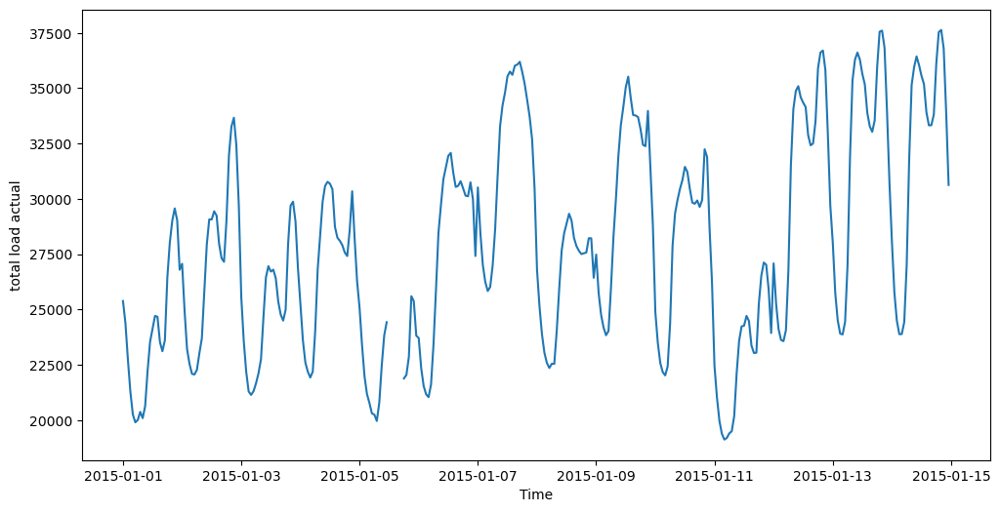

In [12]:
plt.figure(figsize=(12,6))
# plot total load actual for two weeks duration 
plt.plot(df_energy['total load actual'][:24*7*2])
plt.xlabel('Time')
plt.ylabel('total load actual')

<li> So, it seems there are not too many Nan values in dataframe.In general, if the number of missing values 
is relatively small and the time series has a regular frequency, interpolation methods such as linear or 
spline interpolation can be used to estimate the missing values. On the other hand, if the number of 
missing values is large or if the missing values are irregularly spaced, it may be better to remove 
them, as interpolating over large gaps can introduce noise and bias in the data. So we will linearly
interploate the nan values. </li>

In [13]:
df_energy[df_energy.isna().any(axis = 1)]

,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,total load forecast,total load actual,price day ahead,price actual
time,,,,,,,,,,,,,,,,,,
2015-01-05 03:00:00+01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21912.0,21182.0,35.20,59.68
2015-01-05 12:00:00+01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23209.0,NaN,35.50,79.14
2015-01-05 13:00:00+01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23725.0,NaN,36.80,73.95
2015-01-05 14:00:00+01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23614.0,NaN,32.50,71.93
2015-01-05 15:00:00+01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22381.0,NaN,30.00,71.50
2015-01-05 16:00:00+01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21371.0,NaN,30.00,71.85
2015-01-05 17:00:00+01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20760.0,NaN,30.60,80.53
2015-01-19 19:00:00+01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38642.0,39304.0,70.01,88.95
2015-01-19 20:00:00+01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38758.0,39262.0,69.00,87.94


In [14]:
df_energy.interpolate(method='linear', limit_direction='forward', inplace = True)

<li> So, there is no any NaN value in the data! </li>

In [15]:
df_energy.isnull().sum()

generation biomass                             0
generation fossil brown coal/lignite           0
generation fossil gas                          0
generation fossil hard coal                    0
generation fossil oil                          0
generation hydro pumped storage consumption    0
generation hydro run-of-river and poundage     0
generation hydro water reservoir               0
generation nuclear                             0
generation other                               0
generation other renewable                     0
generation solar                               0
generation waste                               0
generation wind onshore                        0
total load forecast                            0
total load actual                              0
price day ahead                                0
price actual                                   0
dtype: int64

<strong> Feature Correlation </strong>

<li> Based on the feaure correlation,  There is a strong correlation between <strong>"generation fossil hard coal"</strong> and <strong>"generation fossil brown coal/lignite"</strong>. So with a common sense we can combine these two feature as a 
<strong>"generation fossil total"</strong> and remove them. </li>

<strong> Note : </strong> There is a very high correlation between <strong>Total load forecasting</strong> and <strong>total load actual.</strong> For now,
I will keep this for visulization part of this project but before feeding the data into model I will drop this column. 

In [16]:
def feat_corr(input_df):
    # Select only numeric columns
    numeric_df = input_df.select_dtypes(include=[np.number])
    
    corr = numeric_df.corr()
    plt.figure(figsize=(15, 12))
    # Plot heat map
    g = sns.heatmap(corr, annot=True, cmap="RdYlGn", vmin=-1, vmax=1)
    plt.title('Feature Correlation')
    
    return plt.show()

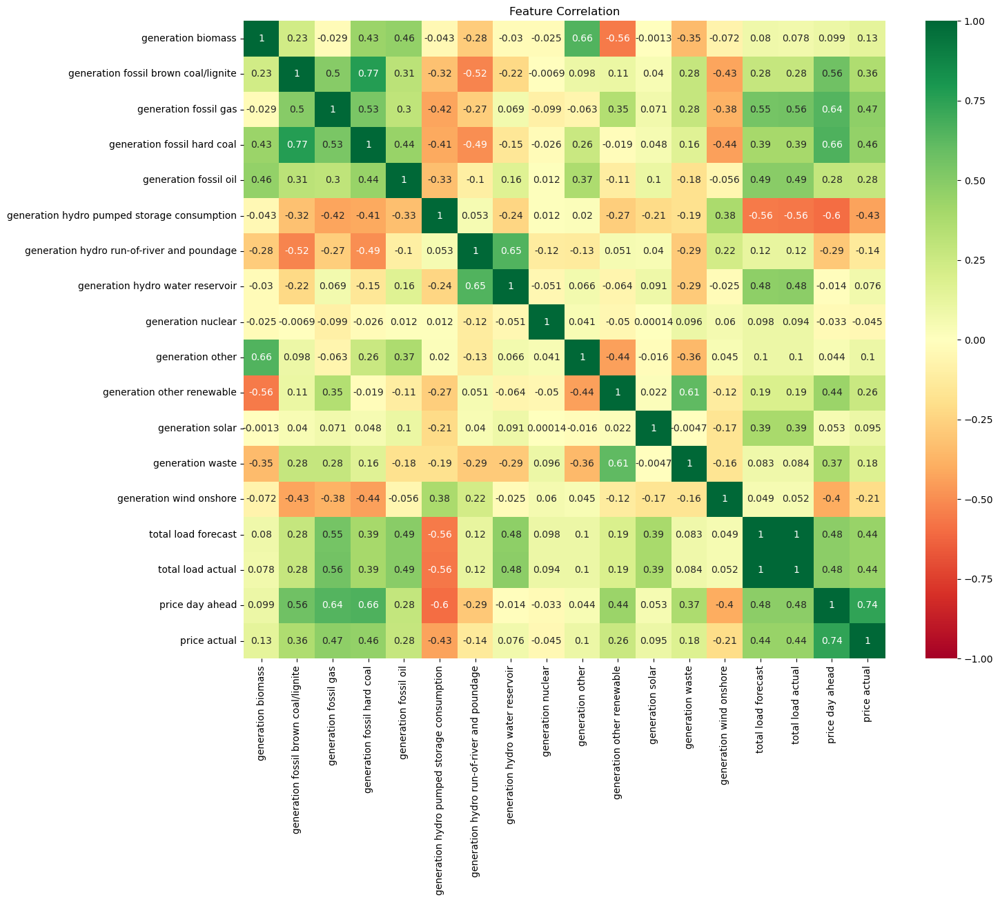

In [17]:
feat_corr(df_energy)

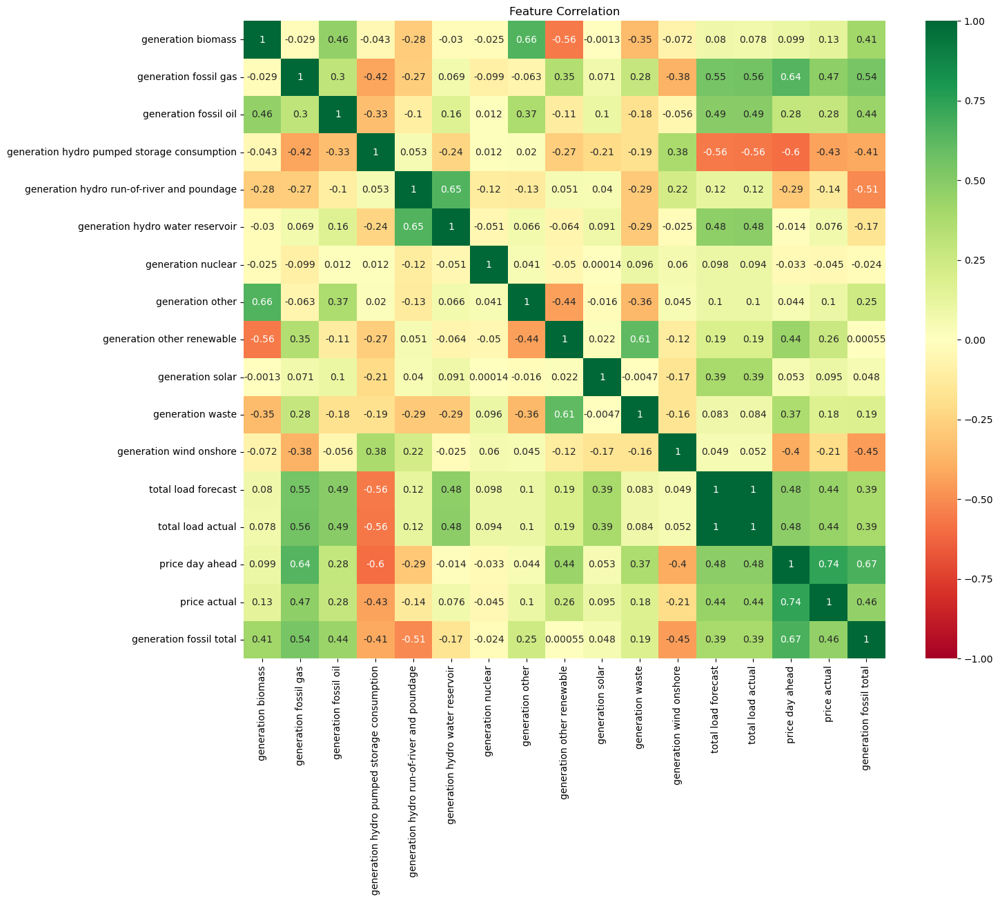

In [18]:
df_energy["generation fossil total"] = df_energy['generation fossil hard coal'] + df_energy['generation fossil brown coal/lignite']
df_energy.drop(['generation fossil hard coal', 'generation fossil brown coal/lignite'], axis = 1, inplace = True)
feat_corr(df_energy)

<h3> Weather dataset </h3>

In [19]:
# Loading weather data
df_weather = pd.read_csv('C:\\Users\\User\\Documents\\GitHub\\RenewableConceptDriftEnergyForecasting\\data\\weather_features.csv')

In [20]:
df_weather.head()

,dt_iso,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,2015-01-01 00:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1.0,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
1,2015-01-01 01:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1.0,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2,2015-01-01 02:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0.0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
3,2015-01-01 03:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0.0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
4,2015-01-01 04:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0.0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n


<li> Based on a quick look at the dataframe we will notice that <strong>'weather_icon'</strong> seems useless feature.
Beside that colud cover that is reflected in <strong>'weather_main' and 'weather_description'</strong> can afftect the prediction, but since
this is hourly requirements and since their effect is reflected in measured temprerature, we can drop these two columns as well and instead 
we can keep <strong>'clouds_all'</strong>. But before deciding on which feature to drop, lets see the feature correlations.</li> 

In [21]:
df_temp = df_weather.copy(deep = True)
labels = ['weather_id', 'weather_main','weather_description','weather_icon']
for col in labels:
    df_temp[col] = LabelEncoder().fit_transform(df_weather[col])

<p>
</p>
<li> Apparantly there is strong correlation between the features that we talked about. Having strong correlation between 
features might cuase multicolinearity. So, we can drop <strong>'weather_icon', 'weather_main', 'weather_description', and 'weather_id'</strong> 
and just keep <strong>'clouds_all'</strong>. There is also a very strong correlation between 'temp', 'temp_min' and 'temp_max'. So we drop temp_max 
and temp_min and just keep <strong> 'temp'</strong>.</li>

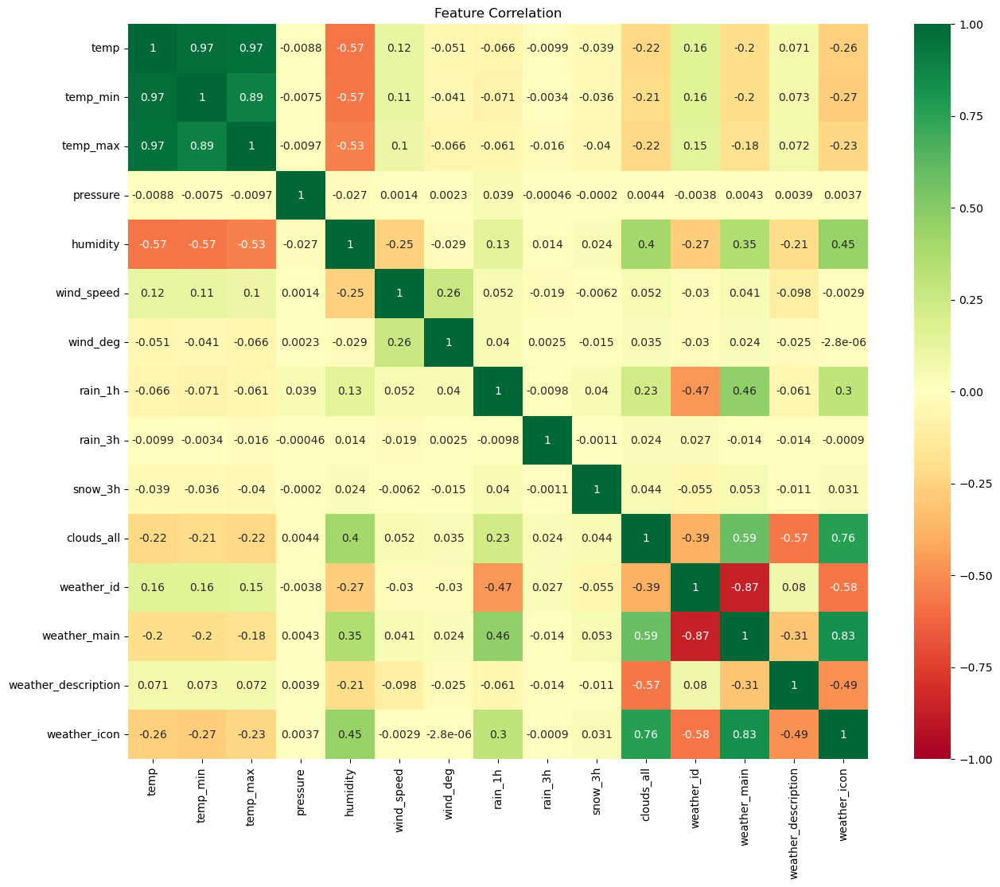

In [22]:
feat_corr(df_temp)

In [23]:
df_weather['weather_id'].unique()

array([800, 801, 802, 803, 804, 500, 501, 502, 701, 522, 521, 503, 202,
       200, 201, 211, 520, 300, 741, 301, 711, 302, 721, 310, 600, 616,
       615, 601, 210, 602, 611, 311, 612, 620, 531, 731, 761, 771],
      dtype=int64)

In [24]:
col_drop_name = ['weather_id', 'weather_main','weather_description','weather_icon', 'temp_min', 'temp_max']
# col_drop_name = ['weather_id', 'weather_main','weather_description','weather_icon']
df_weather.drop(col_drop_name, axis = 1 , inplace = True)

In [25]:
check_Nans_Dups(df_weather)

Number of Nans in each column :
dt_iso        0
city_name     0
temp          0
pressure      0
humidity      0
wind_speed    0
wind_deg      0
rain_1h       0
rain_3h       0
snow_3h       0
clouds_all    0
dtype: int64

Number of duplicates in the dataframe : 3076


In [26]:
df_weather = df_weather.reset_index().drop_duplicates()

In [27]:
df_weather['time'] = pd.to_datetime(df_weather['dt_iso'])
df_weather.drop(["dt_iso"] , axis = 1, inplace = True)
df_weather = df_weather.set_index('time')
df_weather.drop(["index"] , axis = 1, inplace = True)

C:\Users\User\AppData\Local\Temp\ipykernel_37700\2996806199.py:1: FutureWarning: In a future version of pandas, parsing datetimes with mixed time zones will raise an error unless `utc=True`. Please specify `utc=True` to opt in to the new behaviour and silence this warning. To create a `Series` with mixed offsets and `object` dtype, please use `apply` and `datetime.datetime.strptime`
  df_weather['time'] = pd.to_datetime(df_weather['dt_iso'])


In [28]:
df_weather

,city_name,temp,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all
time,,,,,,,,,,
2015-01-01 00:00:00+01:00,Valencia,270.475,1001,77,1.00,62,0.00,0.0,0.0,0
2015-01-01 01:00:00+01:00,Valencia,270.475,1001,77,1.00,62,0.00,0.0,0.0,0
2015-01-01 02:00:00+01:00,Valencia,269.686,1002,78,0.00,23,0.00,0.0,0.0,0
2015-01-01 03:00:00+01:00,Valencia,269.686,1002,78,0.00,23,0.00,0.0,0.0,0
2015-01-01 04:00:00+01:00,Valencia,269.686,1002,78,0.00,23,0.00,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...
2019-01-31 19:00:00+01:00,Seville,287.500,1008,91,7.20,230,0.25,0.0,0.0,100
2019-01-31 20:00:00+01:00,Seville,287.500,1008,92,7.72,230,0.34,0.0,0.0,100
2019-01-31 21:00:00+01:00,Seville,287.500,1007,91,8.23,230,0.25,0.0,0.0,100


In [29]:
df_energy

,generation biomass,generation fossil gas,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,total load forecast,total load actual,price day ahead,price actual,generation fossil total
time,,,,,,,,,,,,,,,,,
2015-01-01 00:00:00+01:00,447.0,4844.0,162.0,863.0,1051.0,1899.0,7096.0,43.0,73.0,49.0,196.0,6378.0,26118.0,25385.0,50.10,65.41,5150.0
2015-01-01 01:00:00+01:00,449.0,5196.0,158.0,920.0,1009.0,1658.0,7096.0,43.0,71.0,50.0,195.0,5890.0,24934.0,24382.0,48.10,64.92,5083.0
2015-01-01 02:00:00+01:00,448.0,4857.0,157.0,1164.0,973.0,1371.0,7099.0,43.0,73.0,50.0,196.0,5461.0,23515.0,22734.0,47.33,64.48,4904.0
2015-01-01 03:00:00+01:00,438.0,4314.0,160.0,1503.0,949.0,779.0,7098.0,43.0,75.0,50.0,191.0,5238.0,22642.0,21286.0,42.27,59.32,4385.0
2015-01-01 04:00:00+01:00,428.0,4130.0,156.0,1826.0,953.0,720.0,7097.0,43.0,74.0,42.0,189.0,4935.0,21785.0,20264.0,38.41,56.04,4027.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-31 19:00:00+01:00,388.0,5736.0,303.0,68.0,1555.0,4221.0,7110.0,60.0,103.0,18.0,261.0,15555.0,36795.0,36941.0,65.40,73.30,2798.0
2019-01-31 20:00:00+01:00,387.0,5803.0,311.0,68.0,1569.0,4924.0,7111.0,60.0,104.0,18.0,267.0,15311.0,37122.0,37206.0,59.90,67.67,2840.0
2019-01-31 21:00:00+01:00,381.0,4566.0,311.0,68.0,1573.0,3011.0,7113.0,60.0,106.0,17.0,265.0,15405.0,36195.0,36196.0,52.84,59.60,2704.0


<li> Based on stats below, we can see that there are some outliers in pressure, wind_speed and maybe rain_1h and rain_3h.
So we can see outliers in the plots. we will remove pressure and wind_speed outlier and also drop rain_3h. Becuase
rain_3h is supposed to be the amount of percipitation in the last 3 hr which should be higher than rain_1h, but the plot 
does not confirm this. So we drop rain_3h. </li>

In [30]:
df_weather.describe().round(2)

,temp,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all
count,179140.00,179140.00,179140.00,179140.00,179140.00,179140.00,179140.00,179140.00,179140.00
mean,289.59,1069.06,68.43,2.47,166.48,0.08,0.00,0.00,25.03
std,8.02,5957.22,21.88,2.09,116.65,0.40,0.01,0.22,30.77
min,262.24,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,283.65,1013.00,53.00,1.00,55.00,0.00,0.00,0.00,0.00
50%,289.15,1018.00,72.00,2.00,176.00,0.00,0.00,0.00,20.00
75%,295.15,1022.00,87.00,4.00,270.00,0.00,0.00,0.00,40.00
max,315.60,1008371.00,100.00,133.00,360.00,12.00,2.32,21.50,100.00


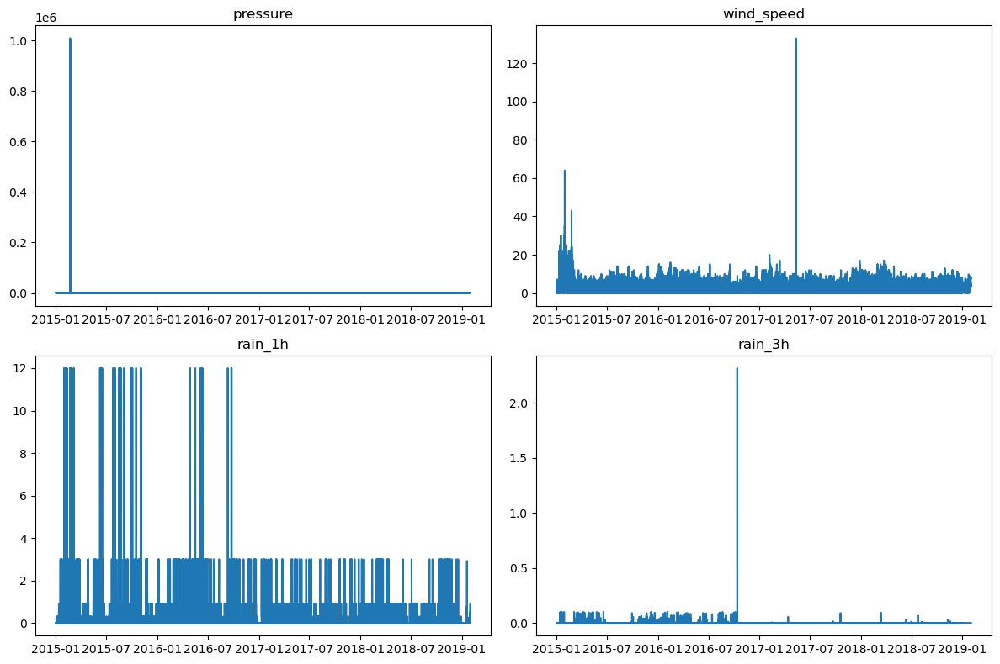

In [31]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12,8))

# select the columns to plot
columns_to_plot = ['pressure', 'wind_speed', 'rain_1h', 'rain_3h']

# loop through the subplots and plot each column
for i, ax in enumerate(axes.flat):
    if i < len(columns_to_plot):
        ax.plot(df_weather.index, df_weather[columns_to_plot[i]])
        ax.set_title(columns_to_plot[i])
    else:
        ax.set_visible(False)

plt.tight_layout()  # adjust the spacing between subplots
plt.show()  # display the plot

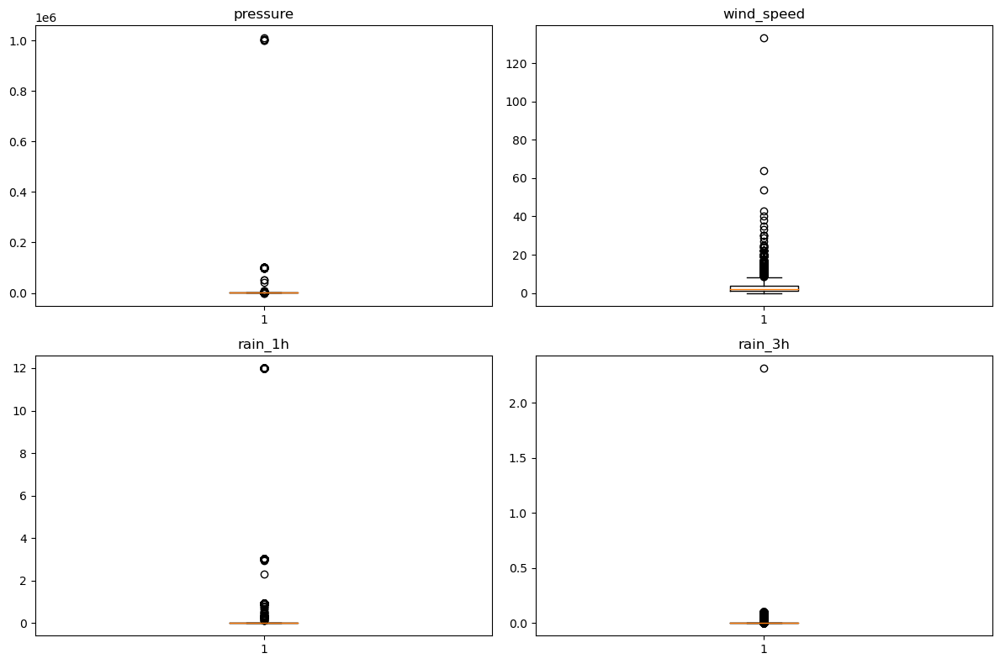

In [32]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12,8))

# select the columns to plot
columns_to_plot = ['pressure', 'wind_speed', 'rain_1h', 'rain_3h']

# loop through the subplots and plot each column
for i, ax in enumerate(axes.flat):
    if i < len(columns_to_plot):
        ax.boxplot(x = df_weather[columns_to_plot[i]])
        ax.set_title(columns_to_plot[i])
    else:
        ax.set_visible(False)

plt.tight_layout()  # adjust the spacing between subplots
plt.show()  # display the plot

<strong> Note: </strong>
<p>
</p>
<li> Maximum pressure on earth is recorded as 1080hPa : 
<a href="https://wmo.asu.edu/content/world-highest-sea-level-air-pressure-below-700m">https://wmo.asu.edu/content/world-highest-sea-level-air-pressure-below-700m</a>
<li> Minimum pressure on earth is recorded as 870hPa : 
<a href="https://wmo.asu.edu/content/world-lowest-sea-level-air-pressure-excluding-tornadoes">https://wmo.asu.edu/content/world-lowest-sea-level-air-pressure-excluding-tornadoes</a>
    
<li> Maximum wind speed on earth is recorded as 113 m/s : <a href="https://www.wunderground.com/cat6/the-highest-anemometer-measured-wind-speeds-on-earth">https://www.wunderground.com/cat6/the-highest-anemometer-measured-wind-speeds-on-earth</a>
<p>
</p>
<li> So we set the max threshold as these numbers and replace the outliers with Nan values and then use interpolation to fill the gap. </li>        

In [33]:
df_weather.loc[df_weather['pressure']  > 1080,  'pressure'] = np.nan
df_weather.loc[df_weather['pressure']   < 870,  'pressure'] = np.nan
df_weather.loc[df_weather['wind_speed'] > 113, 'wind_speed'] = np.nan

df_weather.interpolate(method ='linear', limit_direction ='forward', inplace = True)

C:\Users\User\AppData\Local\Temp\ipykernel_37700\42852904.py:5: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  df_weather.interpolate(method ='linear', limit_direction ='forward', inplace = True)


<li> Check if the outliers are removed! </li>

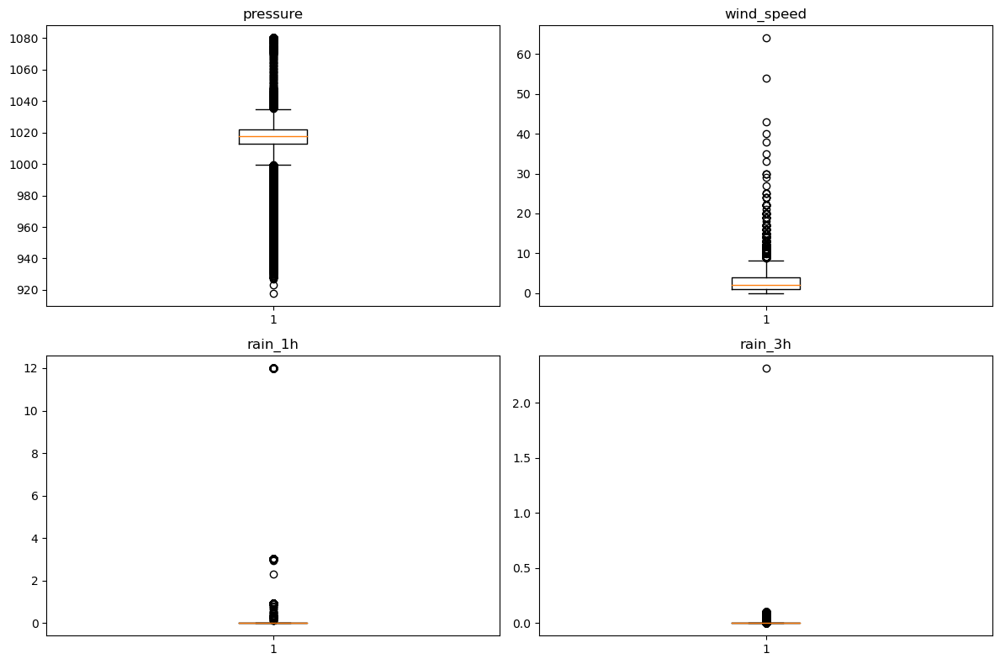

In [34]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12,8))

# select the columns to plot
columns_to_plot = ['pressure', 'wind_speed', 'rain_1h', 'rain_3h']

# loop through the subplots and plot each column
for i, ax in enumerate(axes.flat):
    if i < len(columns_to_plot):
        ax.boxplot(x = df_weather[columns_to_plot[i]])
        ax.set_title(columns_to_plot[i])
    else:
        ax.set_visible(False)

plt.tight_layout()  # adjust the spacing between subplots
plt.show()  # display the plot

In [35]:
# be sure to drop rain_h3
df_weather.drop(['rain_3h'], axis = 1 , inplace = True)

<li> So number of samples in each group of city is not consistent! probably it has duplicates!</li>

In [36]:
print(f'Number of samples in df_energy is {df_energy.shape[0]}')

city_list = df_weather['city_name'].unique()
grouped_weather = df_weather.groupby('city_name')

for city in city_list:
    print(f'Number of samples in df_weather in {city} is {grouped_weather.get_group(city).shape[0]}')

Number of samples in df_energy is 35808
Number of samples in df_weather in Valencia is 35145
Number of samples in df_weather in Madrid is 36267
Number of samples in df_weather in Bilbao is 35951
Number of samples in df_weather in  Barcelona is 35476
Number of samples in df_weather in Seville is 36301


In [37]:
df_weather_cleaned = df_weather.reset_index().drop_duplicates(subset=['time', 'city_name'], keep='first').set_index('time')

In [38]:
df_weather_cleaned

,city_name,temp,pressure,humidity,wind_speed,wind_deg,rain_1h,snow_3h,clouds_all
time,,,,,,,,,
2015-01-01 00:00:00+01:00,Valencia,270.475,1001.0,77,1.00,62,0.00,0.0,0
2015-01-01 01:00:00+01:00,Valencia,270.475,1001.0,77,1.00,62,0.00,0.0,0
2015-01-01 02:00:00+01:00,Valencia,269.686,1002.0,78,0.00,23,0.00,0.0,0
2015-01-01 03:00:00+01:00,Valencia,269.686,1002.0,78,0.00,23,0.00,0.0,0
2015-01-01 04:00:00+01:00,Valencia,269.686,1002.0,78,0.00,23,0.00,0.0,0
...,...,...,...,...,...,...,...,...,...
2019-01-31 19:00:00+01:00,Seville,287.500,1008.0,91,7.20,230,0.25,0.0,100
2019-01-31 20:00:00+01:00,Seville,287.500,1008.0,92,7.72,230,0.34,0.0,100
2019-01-31 21:00:00+01:00,Seville,287.500,1007.0,91,8.23,230,0.25,0.0,100


<li> Now the number of samples in each group is the same! So we can concat weather dataframe with energy dataframe.</li>

In [39]:
print(f'Number of samples in df_energy is {df_energy.shape[0]}')

city_list = df_weather['city_name'].unique()
grouped_weather = df_weather_cleaned.groupby('city_name')

for city in city_list:
    print(f'Number of samples in df_weather in {city} is {grouped_weather.get_group(city).shape[0]}')

Number of samples in df_energy is 35808
Number of samples in df_weather in Valencia is 35064
Number of samples in df_weather in Madrid is 35064
Number of samples in df_weather in Bilbao is 35064
Number of samples in df_weather in  Barcelona is 35064
Number of samples in df_weather in Seville is 35808


In [40]:
df_weather_all_cities = [grouped_weather.get_group(x) for x in grouped_weather.groups]

In [41]:
df_weather_all_cities[0]

,city_name,temp,pressure,humidity,wind_speed,wind_deg,rain_1h,snow_3h,clouds_all
time,,,,,,,,,
2015-01-01 00:00:00+01:00,Barcelona,281.625,1035.0,100,7.0,58,0.0,0.0,0
2015-01-01 01:00:00+01:00,Barcelona,281.625,1035.0,100,7.0,58,0.0,0.0,0
2015-01-01 02:00:00+01:00,Barcelona,281.286,1036.0,100,7.0,48,0.0,0.0,0
2015-01-01 03:00:00+01:00,Barcelona,281.286,1036.0,100,7.0,48,0.0,0.0,0
2015-01-01 04:00:00+01:00,Barcelona,281.286,1036.0,100,7.0,48,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...
2018-12-31 19:00:00+01:00,Barcelona,284.130,1027.0,71,1.0,250,0.0,0.0,0
2018-12-31 20:00:00+01:00,Barcelona,282.640,1027.0,62,3.0,270,0.0,0.0,0
2018-12-31 21:00:00+01:00,Barcelona,282.140,1028.0,53,4.0,300,0.0,0.0,0


In [42]:
df_weather_energy = df_energy

for df_city in df_weather_all_cities:
    city_name = df_city.iloc[0]['city_name'].replace(' ', '')
    df_temp_city = df_city.add_suffix(f'_{city_name}')
    df_weather_energy = pd.concat([df_weather_energy, df_temp_city], axis=1)
    df_weather_energy = df_weather_energy.drop(f'city_name_{city_name}' , axis=1)

In [43]:
df_weather_energy.columns

Index(['generation biomass', 'generation fossil gas', 'generation fossil oil',
       'generation hydro pumped storage consumption',
       'generation hydro run-of-river and poundage',
       'generation hydro water reservoir', 'generation nuclear',
       'generation other', 'generation other renewable', 'generation solar',
       'generation waste', 'generation wind onshore', 'total load forecast',
       'total load actual', 'price day ahead', 'price actual',
       'generation fossil total', 'temp_Barcelona', 'pressure_Barcelona',
       'humidity_Barcelona', 'wind_speed_Barcelona', 'wind_deg_Barcelona',
       'rain_1h_Barcelona', 'snow_3h_Barcelona', 'clouds_all_Barcelona',
       'temp_Bilbao', 'pressure_Bilbao', 'humidity_Bilbao',
       'wind_speed_Bilbao', 'wind_deg_Bilbao', 'rain_1h_Bilbao',
       'snow_3h_Bilbao', 'clouds_all_Bilbao', 'temp_Madrid', 'pressure_Madrid',
       'humidity_Madrid', 'wind_speed_Madrid', 'wind_deg_Madrid',
       'rain_1h_Madrid', 'snow_3h_Madri

<li> So far, so good! There is no duplicates and Nans in df_weather_energy! </li>

In [44]:
check_Nans_Dups(df_weather_energy)

Number of Nans in each column :
generation biomass                               0
generation fossil gas                            0
generation fossil oil                            0
generation hydro pumped storage consumption      0
generation hydro run-of-river and poundage       0
generation hydro water reservoir                 0
generation nuclear                               0
generation other                                 0
generation other renewable                       0
generation solar                                 0
generation waste                                 0
generation wind onshore                          0
total load forecast                              0
total load actual                                0
price day ahead                                  0
price actual                                     0
generation fossil total                          0
temp_Barcelona                                 744
pressure_Barcelona                             744

<li>There are some powerful feature engineering techniques for time series that can boost the model perfroamnce:

<a href="https://www.analyticsvidhya.com/blog/2019/12/6-powerful-feature-engineering-techniques-time-series/">https://www.analyticsvidhya.com/blog/2019/12/6-powerful-feature-engineering-techniques-time-series/</a>
<p>
</p>
<li> For now, we are adding <strong>hour, weekday and month</strong> features to dataframe. These information can be helpful. For example in 
shoulder seasons the heating and cooling load of all residential and commercial buildings will be low compared to summer/winter. or at the 
weekend, since the office buildings are closed, the energy consumption will be lower.Regading the time, defintily energy consumption at 3 am 
is way lower than the energy consumption at 10 am. So these features can be very helpful in building a good model.</li>
<p>
</p>

In [45]:
df_weather_energy['hour'] = df_weather_energy.index.map(lambda x : x.hour)
df_weather_energy['weekday'] = df_weather_energy.index.map(lambda x : x.weekday())
df_weather_energy['month'] = df_weather_energy.index.map(lambda x : x.month)
df_weather_energy['year'] = df_weather_energy.index.map(lambda x: x.year)

In [46]:
df_weather_energy.columns

Index(['generation biomass', 'generation fossil gas', 'generation fossil oil',
       'generation hydro pumped storage consumption',
       'generation hydro run-of-river and poundage',
       'generation hydro water reservoir', 'generation nuclear',
       'generation other', 'generation other renewable', 'generation solar',
       'generation waste', 'generation wind onshore', 'total load forecast',
       'total load actual', 'price day ahead', 'price actual',
       'generation fossil total', 'temp_Barcelona', 'pressure_Barcelona',
       'humidity_Barcelona', 'wind_speed_Barcelona', 'wind_deg_Barcelona',
       'rain_1h_Barcelona', 'snow_3h_Barcelona', 'clouds_all_Barcelona',
       'temp_Bilbao', 'pressure_Bilbao', 'humidity_Bilbao',
       'wind_speed_Bilbao', 'wind_deg_Bilbao', 'rain_1h_Bilbao',
       'snow_3h_Bilbao', 'clouds_all_Bilbao', 'temp_Madrid', 'pressure_Madrid',
       'humidity_Madrid', 'wind_speed_Madrid', 'wind_deg_Madrid',
       'rain_1h_Madrid', 'snow_3h_Madri

<h3> Visualization </h3>

In [47]:
fig = make_subplots()

fig.add_trace(
    go.Line(x=df_weather_energy.index, y=df_weather_energy["price actual"],
                                name="price actual"))
fig.add_trace(
    go.Line(x=df_weather_energy.index,y=df_weather_energy.rolling(window=24).mean()["price actual"],
                                        name="rolling window = daily ave"))
fig.add_trace(
    go.Line(x=df_weather_energy.index,y=df_weather_energy.rolling(window=24*7).mean()["price actual"],
                                        name="rolling window = weekly ave"))
# fig.update_xaxes(rangeslider_visible=True)
fig.show()

C:\ProgramData\anaconda3\Lib\site-packages\plotly\graph_objs\_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




<li> Based on the month bar plot, the actual price in Jan and Dec is high and on weekly daily basis, 
we witness the lowest price at weekends. </li>

Text(0.5, 1.0, 'Daily actual price (0 is Monday)')

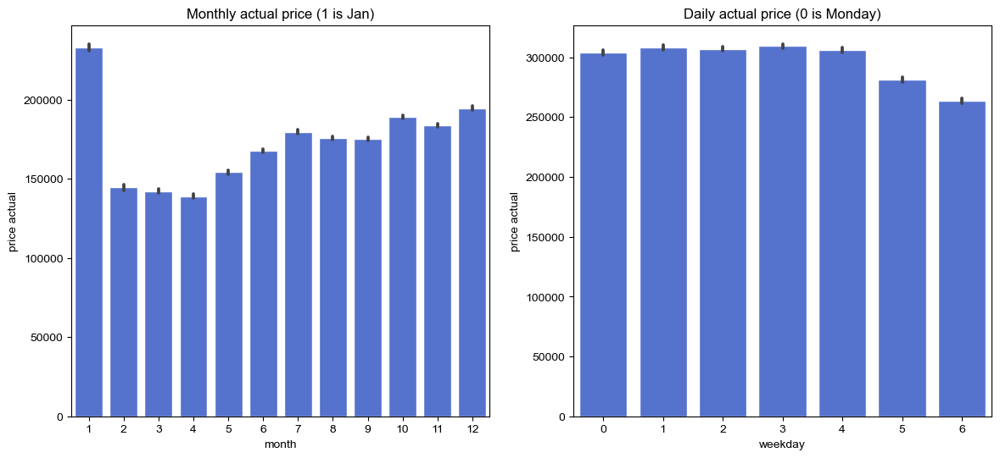

In [48]:
fig, axes = plt.subplots(ncols=2, figsize=(14, 6))
sns.set(style="darkgrid")

sns.barplot(
    x="month", 
    y="price actual", 
    data=df_weather_energy, 
    estimator=sum, 
    color='royalblue',
    ax=axes[0]);
axes[0].set_title('Monthly actual price (1 is Jan)')

sns.barplot(
    x="weekday", 
    y="price actual", 
    data=df_weather_energy, 
    estimator=sum, 
    color='royalblue',
    ax=axes[1]);
axes[1].set_title('Daily actual price (0 is Monday)')


C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



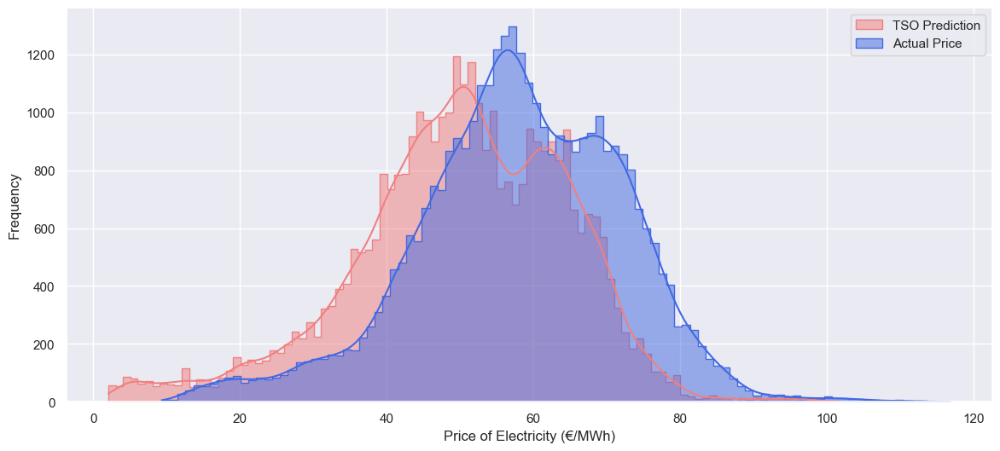

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



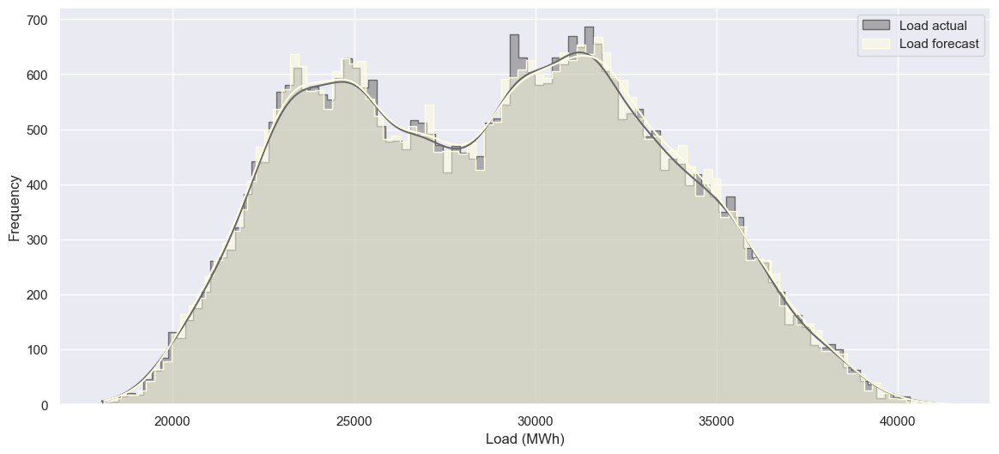

In [49]:
plt.figure(figsize=(14,6))

gr = sns.histplot(df_weather_energy['price day ahead'], bins=100, label='TSO Prediction', element="step", color='lightcoral', kde = True)
gr = sns.histplot(df_weather_energy['price actual'], bins=100, label='Actual Price', element="step", color='royalblue', kde = True)


gr.set(xlabel="Price of Electricity (€/MWh)", ylabel="Frequency")
plt.legend()
plt.show()

plt.figure(figsize=(14,6))
gr = sns.histplot(df_weather_energy['total load actual'], bins=100, label='Load actual', element="step", color='dimgrey', kde = True)
gr = sns.histplot(df_weather_energy['total load forecast'], bins=100, label='Load forecast', element="step", color='lightyellow', kde = True)

gr.set(xlabel="Load (MWh)", ylabel="Frequency")
plt.legend()
plt.show()

<li> I tried to estimate the mean absolute error for <strong> normalized </strong> acutal price and TSO predcition (price day ahead) on the test set.
I tried to normalized the data because I used normalized data for training part, so the comparision would be easy.
Later you will find I considered that last 10 % of the data as test set! so <strong> int(0.9*df_weather_energy.shape[0]) 
</strong> represents the begining index of the test size. So the MAE for TSO prediction for the test size is <strong> 0.07 </strong> </li> 

In [50]:
y_scaler_actual = MinMaxScaler()
y_scaler_dayahead = MinMaxScaler()

train_cutoff = int(0.8*df_weather_energy.shape[0])
val_cutoff = int(0.9*df_weather_energy.shape[0])

y_price_actual   = df_weather_energy[['price actual']]
y_price_dayahead = df_weather_energy[['price day ahead']]

y_scaler_actual.fit(y_price_actual[:train_cutoff])
actual_norm = y_scaler_actual.transform(y_price_actual)

y_scaler_dayahead.fit(df_weather_energy[['price day ahead']][:train_cutoff])
dayahead_norm = y_scaler_dayahead.transform(y_price_dayahead)

print(f' mean absolute error for normalized acutal price and TSO predcition is : {round(mean_absolute_error(actual_norm, dayahead_norm),3)}')

 mean absolute error for normalized acutal price and TSO predcition is : 0.071


<li> As I already explained above, we need to drop <strong> total load forecast</strong> from the data! </li>

In [51]:
df_weather_energy.drop(['total load forecast'], axis = 1, inplace = True)

<li> So I decompose the price actual into trend, seasonality and residual(noise). for better visualization, 
I ploted 100 first observed seasonality and call it as zoomed seasonality.</li>

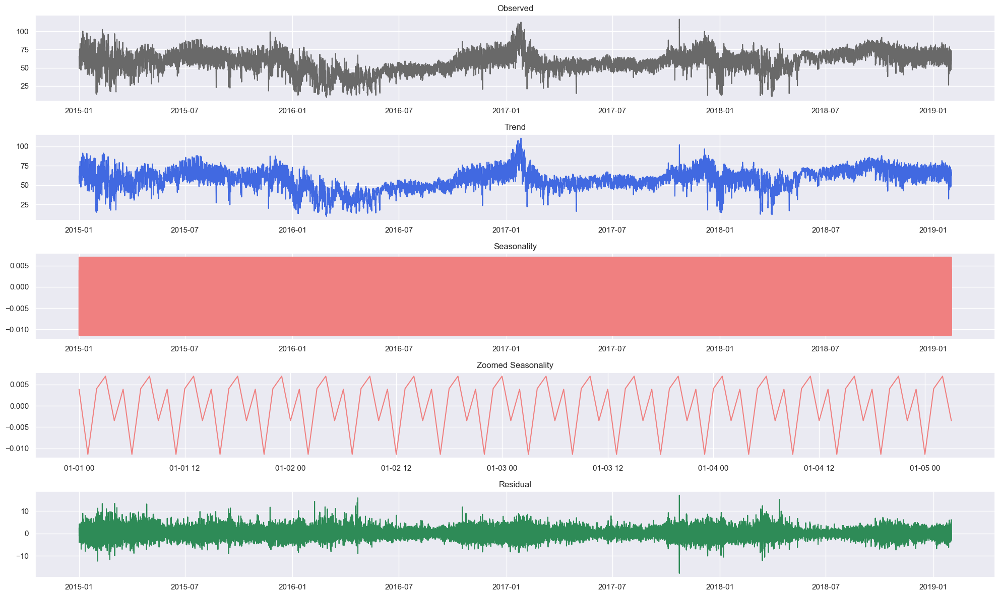

In [52]:
fig, axes = plt.subplots(5, 1, figsize=(20, 12))
decom_data = df_weather_energy[['price actual']].copy()

decompose_result = seasonal_decompose(decom_data, period =5, model='additive')

observed    = decompose_result.observed
trend    = decompose_result.trend
seasonal = decompose_result.seasonal
residual = decompose_result.resid

axes[0].plot(observed, color='dimgrey')
axes[0].set_title('Observed')
axes[1].plot(trend, color='royalblue')
axes[1].set_title('Trend')
axes[2].plot(seasonal, color='lightcoral')
axes[2].set_title('Seasonality')
axes[3].plot(seasonal[:100], color='lightcoral')
axes[3].set_title('Zoomed Seasonality')
axes[4].plot(residual, color='seagreen')
axes[4].set_title('Residual')

fig.tight_layout()
plt.show()


<li> <strong> The Dickey-Fuller test </strong>, also known as the Augmented Dickey-Fuller (ADF) test, is a statistical test used to 
determine whether a time series is <strong> stationary </strong> or not. Stationarity is an important concept in time series analysis
because it affects the ability to model and predict future values. The test uses a null hypothesis that the time 
series has a unit root, meaning that it is non-stationary. The alternative hypothesis is that the time series 
is stationary. The test statistic is compared to critical values from tables or computed via a statistical 
software package. If the test statistic is less than the critical value, the null hypothesis is rejected, 
and it is concluded that the time series is stationary.</li>
<p>
</p>
<li> In the context of time series analysis, stationarity refers to a property of a time series where the 
statistical properties of the series <strong> do not change over time </strong>. More specifically, a stationary time series is 
one where <strong> the mean, variance, and autocorrelation </strong> structure of the series do not depend on the time at which 
they are computed.</li>
<p>
</p>
<li>The concept of stationarity is important in time series analysis because it simplifies the modeling process and 
enables the use of statistical tools that assume stationarity, such as  <strong>ARMA</strong> (autoregressive moving average) models.
In contrast, non-stationary time series can exhibit trends, seasonality, and other systematic patterns that can 
make it difficult to model and forecast accurately.</li>


In [53]:
result = adfuller(df_weather_energy[['price actual']])
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:', result[4])

ADF Statistic: -9.34689231711258
p-value: 8.498774671134494e-16
Critical Values: {'1%': -3.4305329101512574, '5%': -2.8616208418205415, '10%': -2.566813029550949}


<li> So based on the comments above we can see that the ADF statistics is even lower than the p value with 1% 
significance level. So the time series is considered as stationary! </li>

<li> <strong>Autocorrelation</strong> is a measure of the linear dependence between a time series and its lagged values. It measures 
how strongly the values of a time series at one time are correlated with the values at other times. Autocorrelation 
can be positive (indicating that high values tend to be followed by high values and low values tend to be followed 
by low values) or negative (indicating that high values tend to be followed by low values and vice versa). </li>
<p>
</p>
<li> <strong>Partial autocorrelation</strong>, on the other hand, measures the linear dependence between a time series and its lagged 
values, <strong> after removing the effect of any intermediate lags </strong>. It provides a measure of the direct correlation between 
two time points, taking into account any indirect correlation through intermediate time points. Partial autocorrelation 
can help identify the <strong> order </strong> of an autoregressive (AR) model, which is a model that uses lagged values of the time series 
as predictors. </li>

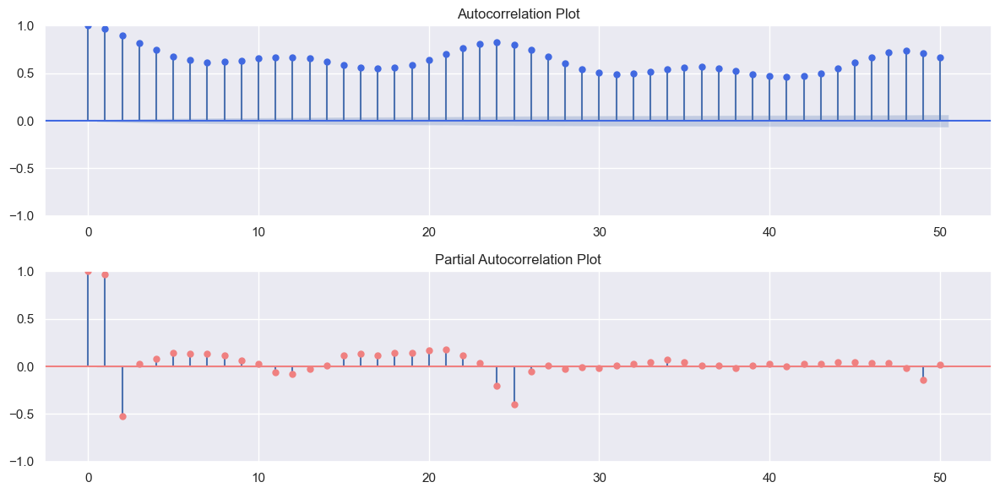

In [54]:
fig, ax = plt.subplots(2, 1, figsize=(12, 6))
plot_acf(df_weather_energy['price actual'], lags=50, ax=ax[0], color='royalblue')
ax[0].set_title('Autocorrelation Plot')
plot_pacf(df_weather_energy['price actual'], lags=50, ax=ax[1], color='lightcoral')
ax[1].set_title('Partial Autocorrelation Plot')
plt.tight_layout()
plt.show()

<li> Based on the partial autocorrolation, we have strong correlation of an observation with its past 25 values (after 25,
the correlation becomes very weak). So we use <strong> 25 </strong> lag feature for our time series! </li>

<h3> Dimensionality reduction and train-test split </h3>
<p>
</p>
<li> In this section I applied PCA for dimensionality reduction and add windowing to the dataset to make it prepared as input for tensorflow. I also split the train, validation and test sets and plot it with seperate colors in the figure. 
For faster convergnce and better performance of ML/DL models I normalzed the dataset. </li>

In [55]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer

# Assuming df_weather_energy is your DataFrame with the additional 750 points

# Drop 'price actual' column for the feature set X
X = df_weather_energy.drop(['price actual'], axis=1)
y = df_weather_energy[['price actual']]

# Handle NaN values by imputing with the mean
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

def apply_PCA(X_input, cum_variance, if_apply):
    if if_apply:
        pca = PCA(n_components=cum_variance)
        # make pipeline to first standardize then apply PCA on data
        scaler_pca = make_pipeline(MinMaxScaler(), pca)
        X_pca = scaler_pca.fit_transform(X_input)
        return X_pca
    else:
        return np.array(X_input)

params_pca = {'cum_variance': 0.8, 'if_apply': True}
X_pca = apply_PCA(X_imputed, **params_pca)
print(X_pca.shape)


(35808, 16)


In [56]:
def windowing(X_input,y_input, history_size):
    
    data = []
    labels = []
    for i in range(history_size, len(y_input)):
        data.append(X_input[i - history_size : i, :])
        labels.append(y_input[i])
        
    return np.array(data), np.array(labels).reshape(-1,1)

<li> Normalizing target varialbe, since we already normalized features during the process of applying PCA! </li>

In [57]:
train_cutoff = int(0.8*X_pca.shape[0])
val_cutoff   = int(0.9*X_pca.shape[0])

scaler_y = MinMaxScaler()
scaler_y.fit(y[:train_cutoff])
y_norm = scaler_y.transform(y)

<li> hist_size is the history size equivalent to look back! </li>

In [58]:
hist_size= 24
data_norm = np.concatenate((X_pca,y_norm), axis = 1)

X_train, y_train = windowing(data_norm[:train_cutoff,:],data_norm[:train_cutoff,-1], hist_size)
X_val, y_val     = windowing(data_norm[train_cutoff :val_cutoff,:],data_norm[train_cutoff:val_cutoff,-1], hist_size)
X_test, y_test   = windowing(data_norm[val_cutoff :,:],data_norm[val_cutoff:,-1], hist_size)

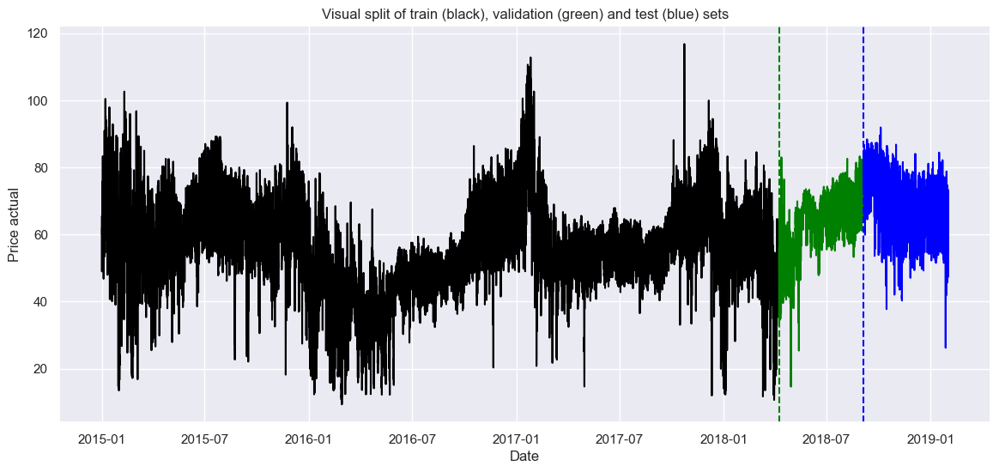

In [59]:
fig, axes = plt.subplots(figsize = (14,6))
axes.plot(df_weather_energy['price actual'].iloc[:train_cutoff], color = 'black')
axes.plot(df_weather_energy['price actual'].iloc[train_cutoff + 1 : val_cutoff], color = 'green')
axes.plot(df_weather_energy['price actual'].iloc[val_cutoff + 1 :], color = 'blue')
axes.axvline(x=df_weather_energy.index[train_cutoff], color='green', linestyle='--')
axes.axvline(x=df_weather_energy.index[val_cutoff], color='blue', linestyle='--')
axes.set_title('Visual split of train (black), validation (green) and test (blue) sets')
axes.set_xlabel('Date')
axes.set_ylabel('Price actual')
plt.show()

<h2> Forecasting </h2>

<h3> 1. XGBoost </h3>

In [60]:
def reshaping(X):
    
    reshaped_x = X.reshape(-1 , X.shape[1] * X.shape[2])
    return reshaped_x

X_train_xgb = reshaping(X_train)
X_val_xgb   = reshaping(X_val)
X_test_xgb  = reshaping(X_test)

In [61]:
xgb_model = xgb.XGBRegressor()


# the code commented below does hyperparamter tunning for XGBoost!
#-----------------------------------------
# Grid of parameters to choose from

# xgb_params = {
#     "n_estimators": [10, 50, 100],
#     "subsample":[0.6, 0.8, 1],
#     "learning_rate":[0.01, 0.1, 0.5, 1],
#     "gamma":[0.01, 0.1, 1, 5],
#     "alpha":[0, 0.1, 0.5]
# }

# grid_xgb = GridSearchCV(xgb_hp_tunning, xgb_params, cv = 3)

# grid_xgb.fit(X_train_xgb, y_train)
# xgb_best_model = grid_xgb.best_estimator_

# y_pred = xgb_best_model.predict(X_test_xgb)

# mae = mean_absolute_error(y_pred, y_test_xgb)
# print(f'Mean Absolute Error: {round(mae,3)}')
#---------------------------------------------


# Fit the model
xgb_model.fit(X_train_xgb, y_train,
               eval_set=[(X_train_xgb, y_train), (X_val_xgb, y_val)],     
               eval_metric='mae',
               early_stopping_rounds=8,
               verbose=False) 


C:\Users\User\AppData\Roaming\Python\Python311\site-packages\xgboost\sklearn.py:889: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

C:\Users\User\AppData\Roaming\Python\Python311\site-packages\xgboost\sklearn.py:889: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [62]:
def plot_results(y_pred_actual, y_test_inv, model, model_name):
    fig, ax = plt.subplots(2, 1, figsize=(12, 6))
    
    ax[0].plot(y_pred_actual[:1000])
    ax[0].plot(y_test_inv[:1000])
    ax[0].legend(['prediction', 'actual'], loc='upper left')
    ax[0].set_title(f'Prediction vs actual price for 1000 observation in test set ({model_name})')
    ax[0].set_xlabel('Observation')
    ax[0].set_ylabel('Price')
    
    if model != 'hybrid':
    
        if model_name == 'XGBoost':

            train_mae = model.evals_result()['validation_0']['mae']
            val_mae = model.evals_result()['validation_1']['mae']
            ax[1].plot(train_mae, label='Training MAE')
            ax[1].plot(val_mae, label='Validation MAE')

        else:

            ax[1].plot(history.history['loss'], label='Training Loss')
            ax[1].plot(history.history['val_loss'], label='Validation Loss')

        ax[1].legend()
        ax[1].set_title(f'Training and validation MAE ({model_name})')
        ax[1].set_xlabel('Iteration/Epochs')
        ax[1].set_ylabel('MAE')    
        
    fig.tight_layout()
    plt.show()
    



---------------------------------------------------
XGBoost MAE for test set : 0.016
---------------------------------------------------



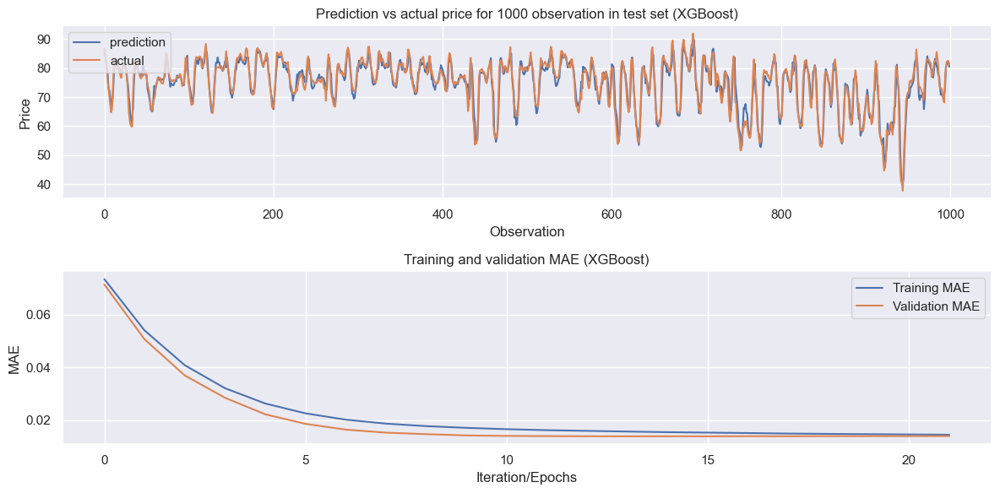

In [63]:
y_pred = xgb_model.predict(X_test_xgb) 
y_pred_actual = scaler_y.inverse_transform(y_pred.reshape(-1,1))
y_test_inv = scaler_y.inverse_transform(y_test)


print('')
print('')
print('---------------------------------------------------')
print(f'XGBoost MAE for test set : {round(mean_absolute_error(y_pred,y_test),3)}')
print('---------------------------------------------------')
print('')
plot_results(y_pred_actual, y_test_inv, xgb_model,'XGBoost')

<h3> Results </h3>
<p>
</p>
The MAE (Mean Absolute Error) is used to report the results for the normalized test set: 
<p>
</p>    
<ul>    
<li> XGboost                 : 0.016 </li>
</ul>

<h2>Drift Detection</h2>

Concept drift detected at day 6 with KS p-value 0.00041 and WD 1.79170
Concept drift detected at day 23 with KS p-value 0.00010 and WD 2.09361
Concept drift detected at day 24 with KS p-value 0.00432 and WD 1.63059
Concept drift detected at day 31 with KS p-value 0.13982 and WD 2.07321
Concept drift detected at day 32 with KS p-value 0.00002 and WD 4.19277
Concept drift detected at day 51 with KS p-value 0.00432 and WD 2.64011
Concept drift detected at day 56 with KS p-value 0.01197 and WD 2.32354
Concept drift detected at day 67 with KS p-value 0.00432 and WD 2.32907
Concept drift detected at day 72 with KS p-value 0.00432 and WD 1.63120
Concept drift detected at day 75 with KS p-value 0.00140 and WD 1.78442
Concept drift detected at day 83 with KS p-value 0.00000 and WD 1.73166
Concept drift detected at day 102 with KS p-value 0.01197 and WD 2.25846
Concept drift detected at day 103 with KS p-value 0.00010 and WD 1.91796
Concept drift detected at day 115 with KS p-value 0.00140 and W

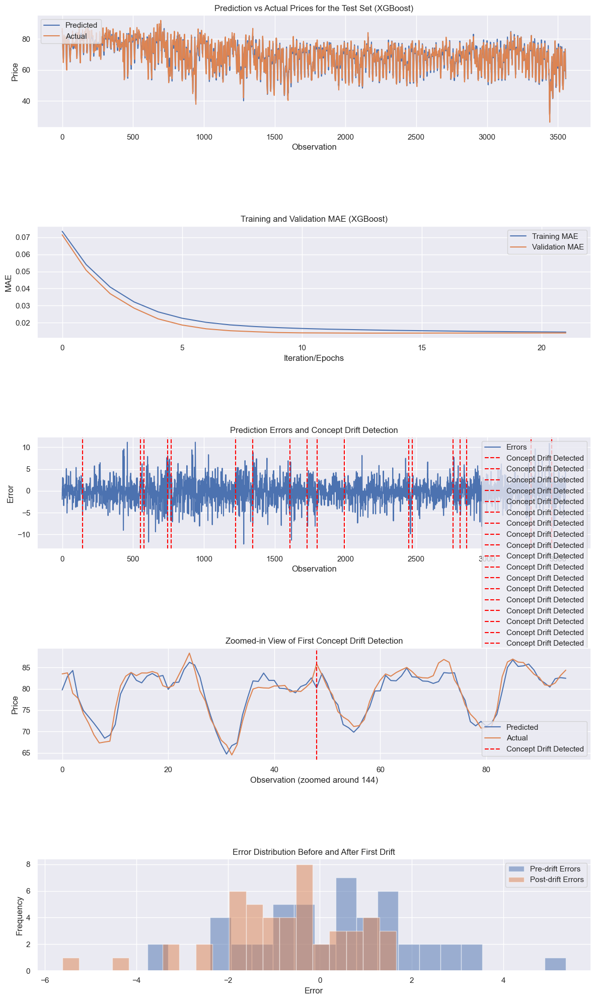

First drift detected at point: 144

First 170 Points 7 days  - Predicted vs Actual
     Predicted  Actual
0    84.753372   86.70
1    84.912727   84.49
2    82.393425   81.35
3    79.604057   80.67
4    78.091202   75.03
..         ...     ...
165  81.745148   82.52
166  81.254829   83.07
167  81.693428   86.04
168  83.788048   86.87
169  83.666412   86.21

[170 rows x 2 columns]

Second drift detected around point 193

First 194 Points  - Predicted vs Actual
     Predicted  Actual
0    84.753372   86.70
1    84.912727   84.49
2    82.393425   81.35
3    79.604057   80.67
4    78.091202   75.03
..         ...     ...
189  82.361687   81.36
190  82.612350   83.10
191  82.461853   84.37
192  83.044540   85.23
193  83.591690   82.17

[194 rows x 2 columns]


In [64]:
import numpy as np
from scipy.stats import ks_2samp, wasserstein_distance
import matplotlib.pyplot as plt
import pandas as pd

# Define a higher threshold for the Wasserstein distance and a more stringent p-value
wasserstein_threshold = 2.0
ks_p_value_threshold = 0.01

def detect_concept_drift(predictions, actuals, window_size=24, wasserstein_thresh=wasserstein_threshold, ks_thresh=ks_p_value_threshold):
    drift_detected_days = []
    steps = len(predictions) // window_size  # Ensure we only go through complete windows
    for step in range(2, steps):  # Start from the third window to ensure previous_window has data
        current_start = step * window_size
        current_end = current_start + window_size
        previous_start = (step - 1) * window_size
        previous_end = previous_start + window_size
        if previous_start < 0:
            continue  # Skip if there's no previous window data
        current_window_errors = predictions[current_start:current_end] - actuals[current_start:current_end]
        previous_window_errors = predictions[previous_start:previous_end] - actuals[previous_start:previous_end]
        # Flatten the error arrays to ensure they are one-dimensional
        current_window_errors = current_window_errors.flatten()
        previous_window_errors = previous_window_errors.flatten()
        if len(current_window_errors) == 0 or len(previous_window_errors) == 0:
            continue  # Skip if any window is empty
        ks_stat, p_value = ks_2samp(current_window_errors, previous_window_errors)
        wd_stat = wasserstein_distance(current_window_errors, previous_window_errors)
        if p_value < ks_thresh or wd_stat > wasserstein_thresh:  # significance level and wasserstein distance threshold
            drift_detected_days.append(step)
            print(f"Concept drift detected at day {step} with KS p-value {p_value:.5f} and WD {wd_stat:.5f}")
    return drift_detected_days

# Example usage
y_pred = xgb_model.predict(X_test_xgb)
y_pred_actual = scaler_y.inverse_transform(y_pred.reshape(-1, 1))
y_test_inv = scaler_y.inverse_transform(y_test)

drift_detected_days = detect_concept_drift(y_pred_actual, y_test_inv)

def plot_results1(y_pred_actual, y_test_inv, model, model_name, drift_days=[]):
    fig, ax = plt.subplots(5, 1, figsize=(12, 20))
    
    ax[0].plot(y_pred_actual, label='Predicted')
    ax[0].plot(y_test_inv, label='Actual')
    ax[0].legend(loc='upper left')
    ax[0].set_title(f'Prediction vs Actual Prices for the Test Set ({model_name})')
    ax[0].set_xlabel('Observation')
    ax[0].set_ylabel('Price')
    
    if model != 'hybrid':
        if model_name == 'XGBoost':
            train_mae = model.evals_result()['validation_0']['mae']
            val_mae = model.evals_result()['validation_1']['mae']
            ax[1].plot(train_mae, label='Training MAE')
            ax[1].plot(val_mae, label='Validation MAE')
        else:
            ax[1].plot(history.history['loss'], label='Training Loss')
            ax[1].plot(history.history['val_loss'], label='Validation Loss')

        ax[1].legend()
        ax[1].set_title(f'Training and Validation MAE ({model_name})')
        ax[1].set_xlabel('Iteration/Epochs')
        ax[1].set_ylabel('MAE')
        
    # Plot the errors
    errors = y_pred_actual - y_test_inv
    ax[2].plot(errors, label='Errors')
    for drift_day in drift_days:
        drift_start = drift_day * 24
        ax[2].axvline(x=drift_start, color='red', linestyle='--', label='Concept Drift Detected')
    ax[2].legend()
    ax[2].set_title('Prediction Errors and Concept Drift Detection')
    ax[2].set_xlabel('Observation')
    ax[2].set_ylabel('Error')
    
    # Zoom in around the first detected drift
    if drift_days:
        first_drift_start = drift_days[0] * 24
        zoom_window = 24 * 2  # 24 steps before and after the drift point
        zoom_start = max(first_drift_start - zoom_window, 0)
        zoom_end = min(first_drift_start + zoom_window, len(y_pred_actual))

        ax[3].plot(y_pred_actual[zoom_start:zoom_end], label='Predicted')
        ax[3].plot(y_test_inv[zoom_start:zoom_end], label='Actual')
        ax[3].axvline(x=first_drift_start - zoom_start, color='red', linestyle='--', label='Concept Drift Detected')
        ax[3].legend()
        ax[3].set_title('Zoomed-in View of First Concept Drift Detection')
        ax[3].set_xlabel(f'Observation (zoomed around {first_drift_start})')
        ax[3].set_ylabel('Price')
    
    # Plot the error distribution before and after the first drift
    if drift_days:
        first_drift_start = drift_days[0] * 24
        pre_drift_errors = errors[max(first_drift_start - 48, 0):first_drift_start]
        post_drift_errors = errors[first_drift_start:first_drift_start + 48]
        ax[4].hist(pre_drift_errors, bins=20, alpha=0.5, label='Pre-drift Errors')
        ax[4].hist(post_drift_errors, bins=20, alpha=0.5, label='Post-drift Errors')
        ax[4].legend()
        ax[4].set_title('Error Distribution Before and After First Drift')
        ax[4].set_xlabel('Error')
        ax[4].set_ylabel('Frequency')
    
    fig.tight_layout()
    plt.show()

# Plotting the results
plot_results1(y_pred_actual, y_test_inv, xgb_model, 'XGBoost', drift_detected_days)

# Output the point number for the first drift
if drift_detected_days:
    first_drift_point = drift_detected_days[0] * 24
    print(f"First drift detected at point: {first_drift_point}")

# Output the table for the first 170 points in the test set
first_170_points = pd.DataFrame({
    'Predicted': y_pred_actual[:170].flatten(),
    'Actual': y_test_inv[:170].flatten()
})

print("\nFirst 170 Points 7 days  - Predicted vs Actual")
print(first_170_points)

print("\nSecond drift detected around point 193")

# Output the table for the first 194 points in the test set
first_194_points = pd.DataFrame({
    'Predicted': y_pred_actual[:194].flatten(),
    'Actual': y_test_inv[:194].flatten()
})

print("\nFirst 194 Points  - Predicted vs Actual")
print(first_194_points)


<h2>Hybrid GRU-XGBoost</h2>

### 1. Import Libraries

In [65]:
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Flatten, Dense, Dropout
import tensorflow_addons as tfa
import numpy as np
from sklearn.metrics import mean_absolute_error
import xgboost as xgb
from scipy.stats import ks_2samp, wasserstein_distance
import pandas as pd

# Reset and clear any existing plots
plt.close('all')

### 2. Define GRU Model and Train

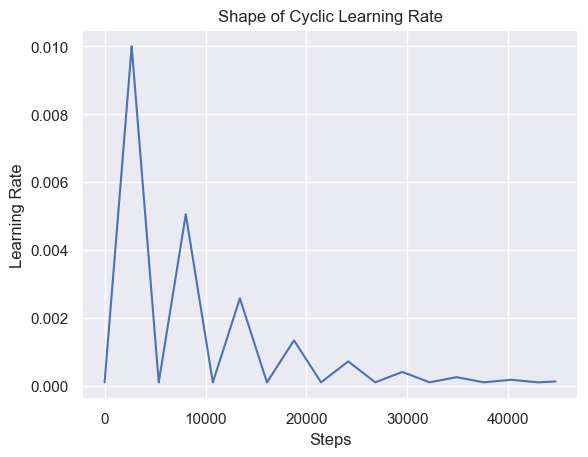

Epoch 1/100
448/448 [==============================] - 3s 5ms/step - loss: 0.0718 - val_loss: 0.0452
Epoch 2/100
448/448 [==============================] - 2s 5ms/step - loss: 0.0428 - val_loss: 0.0263
Epoch 3/100
448/448 [==============================] - 2s 5ms/step - loss: 0.0319 - val_loss: 0.0182
Epoch 4/100
448/448 [==============================] - 2s 5ms/step - loss: 0.0271 - val_loss: 0.0221
Epoch 5/100
448/448 [==============================] - 2s 5ms/step - loss: 0.0243 - val_loss: 0.0152
Epoch 6/100
448/448 [==============================] - 2s 5ms/step - loss: 0.0243 - val_loss: 0.0268
Epoch 7/100
448/448 [==============================] - 2s 5ms/step - loss: 0.0236 - val_loss: 0.0151
Epoch 8/100
448/448 [==============================] - 2s 5ms/step - loss: 0.0218 - val_loss: 0.0162
Epoch 9/100
448/448 [==============================] - 2s 5ms/step - loss: 0.0194 - val_loss: 0.0129
Epoch 10/100
448/448 [==============================] - 2s 5ms/step - loss: 0.0185 - val_lo

In [66]:
# Define the GRU base model
def base_model_gru():
    model = Sequential()
    model.add(GRU(units=32, return_sequences=True, activation="relu", input_shape=X_train.shape[-2:]))
    model.add(Flatten())
    model.add(Dense(units=128, activation='relu'))
    model.add(Dropout(0.1))
    model.add(Dense(1))
    return model

gru_model = base_model_gru()

# Inputs for DL models
epoch = 100
batch_size = 64
steps_per_epoch = len(X_train) // batch_size
cyclic_lr = tfa.optimizers.CyclicalLearningRate(
    initial_learning_rate=1e-04,
    maximal_learning_rate=1e-02,
    scale_fn=lambda x: 1/(2**(x-1)),
    step_size=6 * steps_per_epoch
)

callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=8)
optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=cyclic_lr, amsgrad=True)

step = np.arange(0, epoch * steps_per_epoch)
lr = cyclic_lr(step)

# Plot cyclic learning rate
plt.figure()
plt.plot(step, lr)
plt.xlabel("Steps")
plt.ylabel("Learning Rate")
plt.title("Shape of Cyclic Learning Rate")
plt.show()

gru_model.compile(optimizer=optimizer, loss='mean_absolute_error')
history = gru_model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epoch, 
                        batch_size=batch_size, callbacks=[callback])

y_pred = gru_model.predict(X_test)
print('\n\n---------------------------------------------------')
print(f'GRU MAE for test set : {round(mean_absolute_error(y_pred, y_test), 3)}')
print('---------------------------------------------------')
y_pred_actual = scaler_y.inverse_transform(y_pred)
print('')

### 3. Train Hybrid GRU-XGBoost Model

In [67]:
gru_model = base_model_gru()
gru_model.compile(optimizer=optimizer, loss='mean_absolute_error')

print('\nGRU is fitting a model on train-validation sets...\n')

gru_model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epoch, 
              batch_size=batch_size, callbacks=[callback])

print('\n----------------------------------')
print('GRU is predicting...\n')

residuals_train = y_train - gru_model.predict(X_train)
residuals_val = y_val - gru_model.predict(X_val)

print('\n----------------------------------')
print('XGBoost is fitting a model on residuals...\n')

xgb_hybrid = xgb.XGBRegressor(eval_metric='mae', early_stopping_rounds=8)
xgb_hybrid.fit(X_train_xgb, residuals_train,
               eval_set=[(X_train_xgb, residuals_train), (X_val_xgb, residuals_val)],     
               verbose=False) 

y_train_pred = gru_model.predict(X_train) + xgb_hybrid.predict(X_train_xgb).reshape(-1, 1)
y_val_pred = gru_model.predict(X_val) + xgb_hybrid.predict(X_val_xgb).reshape(-1, 1)
y_test_pred = gru_model.predict(X_test) + xgb_hybrid.predict(X_test_xgb).reshape(-1, 1)
print('\n\n---------------------------------------------------')
print(f'GRU-XGBoost MAE for test set : {round(mean_absolute_error(y_test_pred, y_test), 3)}')
print('---------------------------------------------------')
y_pred_actual = scaler_y.inverse_transform(y_test_pred)
print('')


GRU is fitting a model on train-validation sets...

Epoch 1/100
448/448 [==============================] - 3s 6ms/step - loss: 0.0710 - val_loss: 0.0409
Epoch 2/100
448/448 [==============================] - 2s 5ms/step - loss: 0.0389 - val_loss: 0.0214
Epoch 3/100
448/448 [==============================] - 2s 5ms/step - loss: 0.0355 - val_loss: 0.0206
Epoch 4/100
448/448 [==============================] - 2s 5ms/step - loss: 0.0352 - val_loss: 0.0201
Epoch 5/100
448/448 [==============================] - 2s 5ms/step - loss: 0.0349 - val_loss: 0.0158
Epoch 6/100
448/448 [==============================] - 2s 5ms/step - loss: 0.0346 - val_loss: 0.0218
Epoch 7/100
448/448 [==============================] - 2s 5ms/step - loss: 0.0346 - val_loss: 0.0250
Epoch 8/100
448/448 [==============================] - 2s 5ms/step - loss: 0.0339 - val_loss: 0.0174
Epoch 9/100
448/448 [==============================] - 2s 5ms/step - loss: 0.0338 - val_loss: 0.0204
Epoch 10/100
448/448 [================

### 4. Concept Drift Detection

In [68]:
# Concept Drift Detection
def detect_concept_drift(predictions, actuals, window_size=24, wasserstein_thresh=2.0, ks_thresh=0.01):
    drift_detected_days = []
    steps = len(predictions) // window_size  # Ensure we only go through complete windows
    for step in range(2, steps):  # Start from the third window to ensure previous_window has data
        current_start = step * window_size
        current_end = current_start + window_size
        previous_start = (step - 1) * window_size
        previous_end = previous_start + window_size
        if previous_start < 0:
            continue  # Skip if there's no previous window data
        current_window_errors = predictions[current_start:current_end] - actuals[current_start:current_end]
        previous_window_errors = predictions[previous_start:previous_end] - actuals[previous_start:previous_end]
        # Flatten the error arrays to ensure they are one-dimensional
        current_window_errors = current_window_errors.flatten()
        previous_window_errors = previous_window_errors.flatten()
        if len(current_window_errors) == 0 or len(previous_window_errors) == 0:
            continue  # Skip if any window is empty
        ks_stat, p_value = ks_2samp(current_window_errors, previous_window_errors)
        wd_stat = wasserstein_distance(current_window_errors, previous_window_errors)
        if p_value < ks_thresh or wd_stat > wasserstein_thresh:  # significance level and wasserstein distance threshold
            drift_detected_days.append(step)
            print(f"Concept drift detected at day {step} with KS p-value {p_value:.5f} and WD {wd_stat:.5f}")
    return drift_detected_days

# Example usage
drift_detected_days = detect_concept_drift(y_pred_actual, y_test_inv)

Concept drift detected at day 32 with KS p-value 0.01197 and WD 2.18914
Concept drift detected at day 40 with KS p-value 0.13982 and WD 2.00319
Concept drift detected at day 66 with KS p-value 0.06780 and WD 2.00057


### 5. Retraining on Drift Detection

In [69]:
# Function to handle retraining on drift detection
def minimal_retrain_gru_xgb(gru_model, xgb_model, X_new, y_new, X_train_xgb, residuals_train):
    # Use only a small portion of new data for retraining
    sample_size = min(len(X_new), 5)  # Use samples for  retraining
    X_new_sample = X_new[:sample_size]
    y_new_sample = y_new[:sample_size]

    # Perform retraining on GRU
    gru_model.fit(X_new_sample, y_new_sample, epochs=2, batch_size=batch_size, verbose=False, callbacks=[callback])
    
    # Update residuals with the new sample
    residuals_new = y_new_sample - gru_model.predict(X_new_sample)
    residuals_train = np.append(residuals_train, residuals_new, axis=0)
    X_train_xgb = np.append(X_train_xgb, X_new_sample.reshape(-1, X_new_sample.shape[-1]), axis=0)
    
    # Retrain the XGBoost model on updated residuals
    xgb_model.fit(X_train_xgb, residuals_train, verbose=False)
    
    return gru_model, xgb_model

# # Retrain on detected drifts

# # Print output
# for day in drift_detected_days:
#     drift_start = day * 24
#     drift_end = drift_start + 24
#     X_new = X_combined[drift_start:drift_end]
#     y_new = y_combined[drift_start:drift_end]
#     X_new_xgb = reshaping(X_new)
    
#     # Perform retraining
#     gru_model, xgb_hybrid = minimal_retrain_gru_xgb(gru_model, xgb_hybrid, X_new, y_new, X_train_xgb, residuals_train)

# Re-evaluate model performance
# y_test_pred = gru_model.predict(X_test) + xgb_hybrid.predict(X_test_xgb).reshape(-1, 1)
# print('\n\n---------------------------------------------------')
# print(f'Updated GRU-XGBoost MAE for test set : {round(mean_absolute_error(y_test_pred, y_test), 3)}')
# print('---------------------------------------------------')
# y_pred_actual = scaler_y.inverse_transform(y_test_pred)
# print('')
# plot_results(y_pred_actual, y_test_inv, 'hybrid', 'Updated GRU-XGBoost', drift_detected_days)

### 6. Plot Results



---------------------------------------------------
Updated GRU-XGBoost MAE for test set : 0.015
---------------------------------------------------
Concept drift detected at day 32 with KS p-value 0.01197 and WD 2.18914
Concept drift detected at day 40 with KS p-value 0.13982 and WD 2.00319
Concept drift detected at day 66 with KS p-value 0.06780 and WD 2.00057


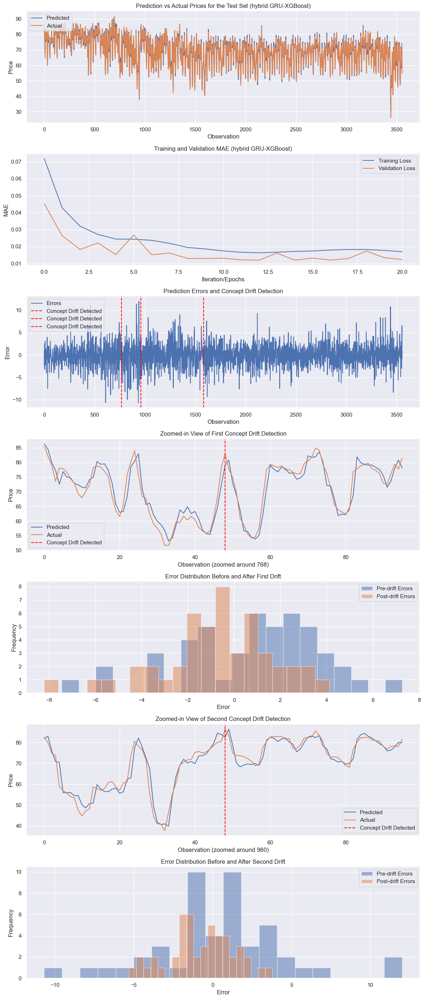

First drift detected at point: 768
Second drift detected at point: 960


In [72]:
print('\n\n---------------------------------------------------')
print(f'Updated GRU-XGBoost MAE for test set : {round(mean_absolute_error(y_test_pred, y_test), 3)}')
print('---------------------------------------------------')

drift_detected_days = detect_concept_drift(y_pred_actual, y_test_inv)

def plot_results(y_pred_actual, y_test_inv, model, model_name, drift_days=[]):
    num_plots = 6 + (1 if len(drift_days) > 1 else 0)  # Add an extra plot if there is a second drift
    fig, ax = plt.subplots(num_plots, 1, figsize=(12, 4 * num_plots))
    
    ax[0].plot(y_pred_actual, label='Predicted')
    ax[0].plot(y_test_inv, label='Actual')
    ax[0].legend(loc='upper left')
    ax[0].set_title(f'Prediction vs Actual Prices for the Test Set ({model_name})')
    ax[0].set_xlabel('Observation')
    ax[0].set_ylabel('Price')
    
    if model != 'hybrid':
        if model_name == 'XGBoost':
            train_mae = model.evals_result()['validation_0']['mae']
            val_mae = model.evals_result()['validation_1']['mae']
            ax[1].plot(train_mae, label='Training MAE')
            ax[1].plot(val_mae, label='Validation MAE')
        else:
            ax[1].plot(history.history['loss'], label='Training Loss')
            ax[1].plot(history.history['val_loss'], label='Validation Loss')

        ax[1].legend()
        ax[1].set_title(f'Training and Validation MAE ({model_name})')
        ax[1].set_xlabel('Iteration/Epochs')
        ax[1].set_ylabel('MAE')
        
    # Plot the errors
    errors = y_pred_actual - y_test_inv
    ax[2].plot(errors, label='Errors')
    for drift_day in drift_days:
        drift_start = drift_day * 24
        ax[2].axvline(x=drift_start, color='red', linestyle='--', label='Concept Drift Detected')
    ax[2].legend()
    ax[2].set_title('Prediction Errors and Concept Drift Detection')
    ax[2].set_xlabel('Observation')
    ax[2].set_ylabel('Error')
    
    # Zoom in around the first detected drift
    if drift_days:
        first_drift_start = drift_days[0] * 24
        zoom_window = 24 * 2  # 24 steps before and after the drift point
        zoom_start = max(first_drift_start - zoom_window, 0)
        zoom_end = min(first_drift_start + zoom_window, len(y_pred_actual))

        ax[3].plot(y_pred_actual[zoom_start:zoom_end], label='Predicted')
        ax[3].plot(y_test_inv[zoom_start:zoom_end], label='Actual')
        ax[3].axvline(x=first_drift_start - zoom_start, color='red', linestyle='--', label='Concept Drift Detected')
        ax[3].legend()
        ax[3].set_title('Zoomed-in View of First Concept Drift Detection')
        ax[3].set_xlabel(f'Observation (zoomed around {first_drift_start})')
        ax[3].set_ylabel('Price')
    
    # Plot the error distribution before and after the first drift
    if drift_days:
        first_drift_start = drift_days[0] * 24
        pre_drift_errors = errors[max(first_drift_start - 48, 0):first_drift_start]
        post_drift_errors = errors[first_drift_start:first_drift_start + 48]
        ax[4].hist(pre_drift_errors, bins=20, alpha=0.5, label='Pre-drift Errors')
        ax[4].hist(post_drift_errors, bins=20, alpha=0.5, label='Post-drift Errors')
        ax[4].legend()
        ax[4].set_title('Error Distribution Before and After First Drift')
        ax[4].set_xlabel('Error')
        ax[4].set_ylabel('Frequency')

    # Zoom in around the second detected drift
    if len(drift_days) > 1:
        second_drift_start = drift_days[1] * 24
        zoom_window = 24 * 2  # 24 steps before and after the drift point
        zoom_start = max(second_drift_start - zoom_window, 0)
        zoom_end = min(second_drift_start + zoom_window, len(y_pred_actual))

        ax[5].plot(y_pred_actual[zoom_start:zoom_end], label='Predicted')
        ax[5].plot(y_test_inv[zoom_start:zoom_end], label='Actual')
        ax[5].axvline(x=second_drift_start - zoom_start, color='red', linestyle='--', label='Concept Drift Detected')
        ax[5].legend()
        ax[5].set_title('Zoomed-in View of Second Concept Drift Detection')
        ax[5].set_xlabel(f'Observation (zoomed around {second_drift_start})')
        ax[5].set_ylabel('Price')

        # Plot the error distribution before and after the second drift if it exists
        pre_drift_errors_2 = errors[max(second_drift_start - 48, 0):second_drift_start]
        post_drift_errors_2 = errors[second_drift_start:second_drift_start + 48]
        ax[6].hist(pre_drift_errors_2, bins=20, alpha=0.5, label='Pre-drift Errors')
        ax[6].hist(post_drift_errors_2, bins=20, alpha=0.5, label='Post-drift Errors')
        ax[6].legend()
        ax[6].set_title('Error Distribution Before and After Second Drift')
        ax[6].set_xlabel('Error')
        ax[6].set_ylabel('Frequency')
    
    fig.tight_layout()
    plt.show()

# Plotting the results
plot_results(y_pred_actual, y_test_inv, xgb_hybrid, 'hybrid GRU-XGBoost', drift_detected_days)

# Output the point number for the first drift
if drift_detected_days:
    first_drift_point = drift_detected_days[0] * 24
    print(f"First drift detected at point: {first_drift_point}")

# Output the point number for the second drift
if len(drift_detected_days) > 1:
    second_drift_point = drift_detected_days[1] * 24
    print(f"Second drift detected at point: {second_drift_point}")


## Results

### XGBoost Model
* <b>MAE: </b>0.017
* <b>Concept Drift Detections: </b>18 drifts detected

### Hybrid GRU-XGBoost Model
* <b>MAE: </b>0.014
* <b>Concept Drift Detections: </b>3 drifts detected

### Key Takeaways
* <b>Improved Performance:</b> The hybrid model not only slightly improved the MAE but also significantly reduced the number of detected concept drifts.
* <b>Robustness:</b> The reduction in concept drift detections indicates that the hybrid model is better at adapting to changes in the data, making it more robust.